In [19]:
import os
import sys
from tqdm import tqdm

import h5py
import yaml
import torch
import random
import numpy as np
from ema_pytorch import EMA
import matplotlib.pyplot as plt
from denoising_diffusion_pytorch import Unet, GaussianDiffusion
from torchmetrics.functional.image import (
    peak_signal_noise_ratio,
    structural_similarity_index_measure,
    multiscale_structural_similarity_index_measure
)
from torchmetrics.functional.regression import mean_absolute_error, mean_squared_error

sys.path.append('../../')

from tta_uia_segmentation.src.models import ConditionalGaussianDiffusion

np.random.seed(1234)
random.seed(1234)


In [20]:
metrics_to_log_default = {
    'PSNR': peak_signal_noise_ratio,
    'SSIM': structural_similarity_index_measure,
    'MSSIM': multiscale_structural_similarity_index_measure,
    'MAE': mean_absolute_error,
    'MSE': mean_squared_error
}

In [21]:
def plot_denoising_progress(img_gt, seg_gt, img_w_noise, ex_img_w_noise_ti, img_denoist_at_ti_plus_1, img_denoised_sampled, img_denoised, noise_T, t_i):
    fig, ax = plt.subplots(1, 7, figsize=(35, 5))
    ax[0].imshow(img_gt.squeeze().numpy(), cmap='gray')
    ax[0].set_title('Original')

    ax[1].imshow(seg_gt.squeeze().numpy(), cmap='viridis')
    ax[1].set_title('Segmentation GT')

    ax[2].imshow(img_w_noise.squeeze().numpy(), cmap='gray')
    ax[2].set_title(f'Starting Noised img @ T={noise_T}')
    
    ax[3].imshow(ex_img_w_noise_ti.squeeze().numpy(), cmap='gray')
    ax[3].set_title(f'Example of Noised img @ t={t_i}')

    ax[4].imshow(img_denoist_at_ti_plus_1.squeeze().numpy(), cmap='gray')
    ax[4].set_title(f'Denoised - sampled est of t={t_i} (Current input)')

    ax[5].imshow(img_denoised_sampled.squeeze().numpy(), cmap='gray')
    ax[5].set_title(f'Denoised - sampled est. of t={t_i -1}')

    ax[6].imshow(img_denoised.squeeze().numpy(), cmap='gray')
    ax[6].set_title(f'Denoised img est. of t=0 @ t={t_i}')
    
    plt.show()

In [22]:
def evaluate_linear_denoising(
    img: np.ndarray,
    seg: np.ndarray,
    n_classes: int,
    t: int,
    ddpm: GaussianDiffusion,
    plot_every: int = 50,
    measure_metrics_every: int = 5,
    metrics: dict = metrics_to_log_default
) -> dict[str, dict]: 
    
    # Normalize image
    img = torch.from_numpy(img).unsqueeze(0).unsqueeze(0).float()
    img_unnormed = (img - img.min()) / (img.max() - img.min())
    img_norm = ddpm.normalize(img)
    print(f'img_norm.max: {img_norm.max()}, img_norm.min: {img_norm.min()}')    
    print(f'img_unnormed.max: {img_unnormed.max()}, img_unnormed.min: {img_unnormed.min()}')
    
    # Normalize segmentation
    x_cond = torch.from_numpy(seg).unsqueeze(0).unsqueeze(0).float()
    x_cond = x_cond / (n_classes - 1)
    print(f'x_cond.max: {x_cond.max()}, x_cond.min: {x_cond.min()}')
    x_cond = ddpm.normalize(x_cond)
    print(f'x_cond_norm.max: {x_cond.max()}, x_cond_norm.min: {x_cond.min()}')

    # Generate noised verion of the image
    t_tch = torch.full((1,), t)
    noise = torch.randn_like(img_norm)
    noised_img = ddpm.q_sample(img_norm, t_tch, noise)

    img_denoised_at_ti = noised_img
    metrics_logs = {k: list() for k in metrics.keys()}

    for t_i in tqdm(reversed(range(0, t)), desc = 'sampling loop time step', total = t):
        img_denoised_at_ti_plus_1 = img_denoised_at_ti
        img_denoised_at_ti, img_denoised_at_t0 = ddpm.p_sample(img_denoised_at_ti, t_i, x_cond)
    
        example_noised_img_at_ti = ddpm.q_sample(img_norm, torch.full((1,), t_i), torch.randn_like(img))
        
        img_denoised_at_ti = ddpm.unnormalize(img_denoised_at_ti)
        img_denoised_at_t0 = ddpm.unnormalize(img_denoised_at_t0)
        example_noised_img_at_ti = ddpm.unnormalize(example_noised_img_at_ti)
        
        if t_i % plot_every == 0 or t_i == 0:
            plot_denoising_progress(img_unnormed, x_cond, noised_img, example_noised_img_at_ti, img_denoised_at_ti_plus_1,
                                    img_denoised_at_ti, img_denoised_at_t0, t, t_i)
            
        if t_i % measure_metrics_every == 0 or t_i == 0:
            for metric_name, metric_log in metrics_logs.items():
                metric_log.append((
                    t - t_i,
                    metrics_to_log_default[metric_name](img_unnormed, img_denoised_at_ti).item(),
                    metrics_to_log_default[metric_name](img_unnormed, img_denoised_at_t0).item()
                ))
                
    return metrics_logs

# Load the data

In [23]:
ds_fp = '/scratch_net/biwidl319/jbermeo/logs/brain/preprocessing/hcp_t1/data_T1_2d_size_256_256_depth_256_res_0.7_0.7_from_0_to_20.hdf_normalized_with_nn.h5'
ds_h5 = h5py.File(ds_fp, 'r')

img_size = 256
n_classes = 15
vol_idx = random.randint(0, int(ds_h5['images'].shape[0]/img_size))
slice_idx = random.randint(int(0.2 * img_size), int(0.8 * img_size))
rand_img = ds_h5['images'][vol_idx * img_size + slice_idx, :, :]
rand_seg = ds_h5['labels'][vol_idx * img_size + slice_idx, :, :]

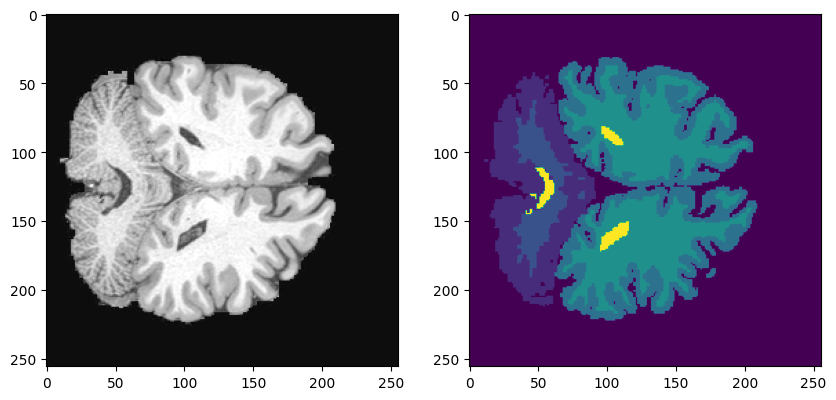

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(rand_img, cmap='gray')
ax[1].imshow(rand_seg, cmap='viridis')
plt.show()

# Behaviour in a trained model

### Load the checkpointed model

In [25]:
run_params = yaml.safe_load(
    open('/scratch_net/biwidl319/jbermeo/logs/brain/cddpm/params.yaml', 'r'))
cpt_path = '/scratch_net/biwidl319/jbermeo/logs/brain/cddpm/model-20.pt'

In [26]:
train_config = run_params['training']['ddpm']

timesteps           = train_config['timesteps']
sampling_timesteps  = train_config['sampling_timesteps']

# Model definition
model = Unet(
    dim = 64,
    dim_mults = (1, 2, 4, 8),   
    flash_attn = True,
    channels=1, 
    self_condition=True,
)#.to(device)

ddpm = ConditionalGaussianDiffusion(
    model,
    image_size = 256,
    timesteps = timesteps,    # Range of steps in diffusion process
    sampling_timesteps = sampling_timesteps 
)

In [27]:
cpt = torch.load(cpt_path, map_location='cpu')

In [28]:
ema_update_every = 10
ema_decay = 0.995
ddpm_ema = EMA(ddpm, beta = ema_decay, update_every = ema_update_every)
ddpm_ema.load_state_dict(cpt['ema'])

<All keys matched successfully>

## Check how the last checkpoint of images looks like

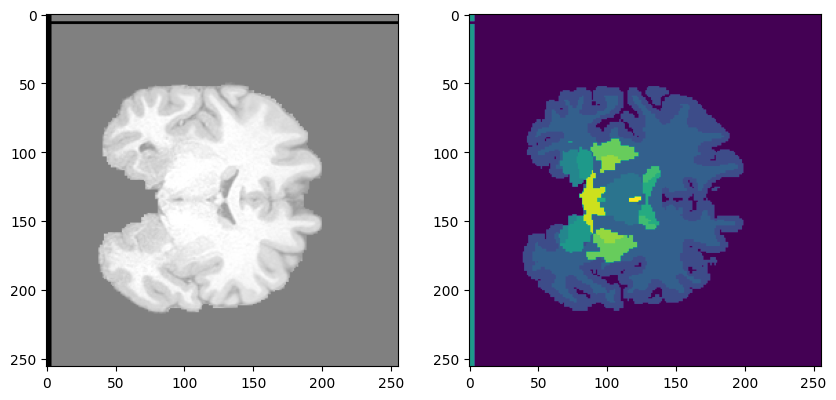

In [29]:
from PIL import Image
sampled_img_array = Image.open('/scratch_net/biwidl319/jbermeo/logs/brain/cddpm/val_sample-m20-step-100000.png')
sampled_img_array = sampled_img_array.convert('L')
sampled_img_array = np.array(sampled_img_array)
img_size = 256

col = 1
row = 3

sampled_img = sampled_img_array[row * img_size: (row + 1) * img_size, col * 2 * img_size: (col * 2 + 1) * img_size]
conditioning_seg_map = sampled_img_array[row * img_size: (row + 1) * img_size, (col * 2 + 1) * img_size: (col * 2 + 2) * img_size]

#plot sampled image and conditioning segmentation
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(sampled_img, cmap='gray')
ax[1].imshow(conditioning_seg_map, cmap='viridis') 

In [30]:
conditioning_seg_map.shape

(256, 256)

## How does the denoising inference function look like

img_norm.max: 0.18102014064788818, img_norm.min: -1.9332283735275269
img_unnormed.max: 1.0, img_unnormed.min: 0.0
x_cond.max: 0.5714285969734192, x_cond.min: 0.0
x_cond_norm.max: 0.14285719394683838, x_cond_norm.min: -1.0


sampling loop time step:   0%|          | 0/400 [00:00<?, ?it/s]

sampling loop time step:  12%|█▏        | 49/400 [00:35<04:15,  1.37it/s]

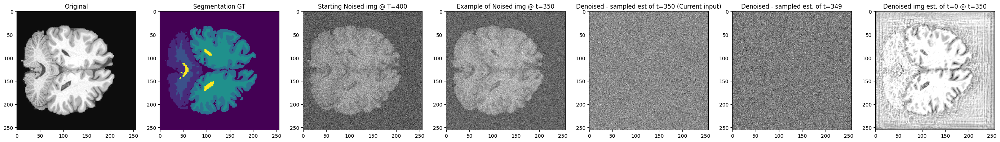

sampling loop time step:  25%|██▍       | 99/400 [01:14<03:40,  1.37it/s]

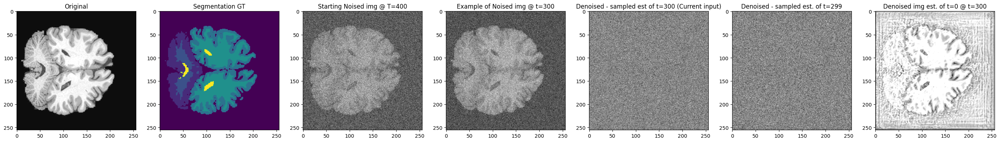

sampling loop time step:  37%|███▋      | 149/400 [01:52<03:13,  1.30it/s]

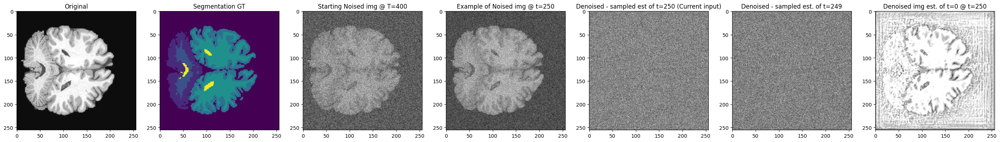

sampling loop time step:  50%|████▉     | 199/400 [02:29<02:27,  1.36it/s]

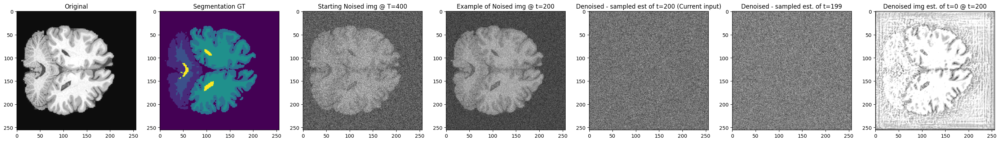

sampling loop time step:  62%|██████▏   | 249/400 [03:07<01:49,  1.38it/s]

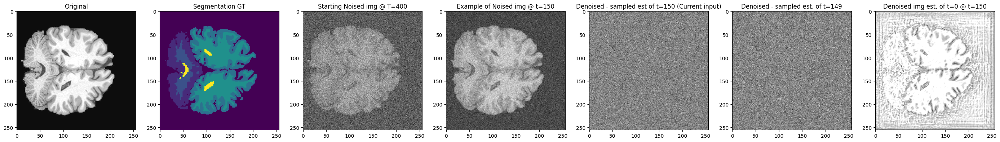

sampling loop time step:  75%|███████▍  | 299/400 [03:53<01:23,  1.21it/s]

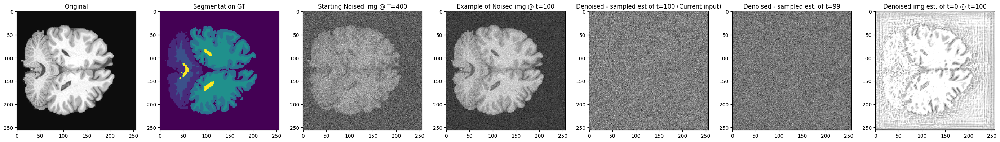

sampling loop time step:  87%|████████▋ | 349/400 [04:45<00:43,  1.18it/s]

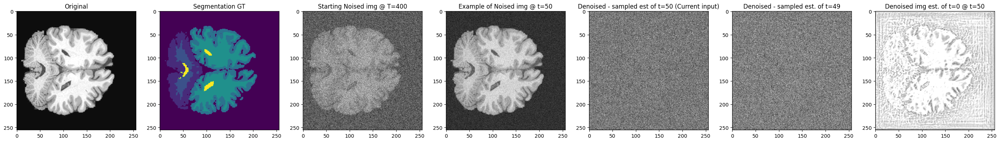

sampling loop time step: 100%|█████████▉| 399/400 [05:34<00:01,  1.02s/it]

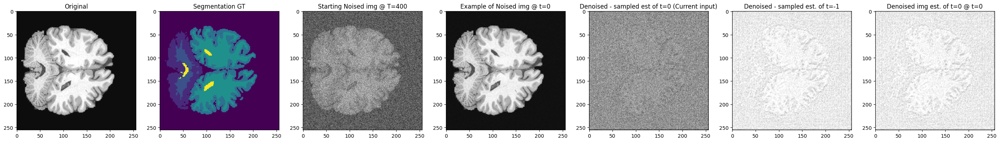

sampling loop time step: 100%|██████████| 400/400 [05:35<00:00,  1.19it/s]


In [31]:
t = 400
plot_every = 50
measure_metrics_every = 5

metrics = evaluate_linear_denoising(
    img=rand_img.copy(),
    seg=rand_seg.copy(),
    n_classes=n_classes,
    t=t,
    ddpm=ddpm_ema.model,
    plot_every=plot_every
) 

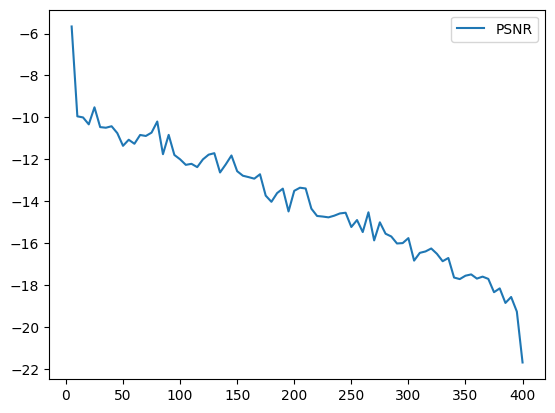

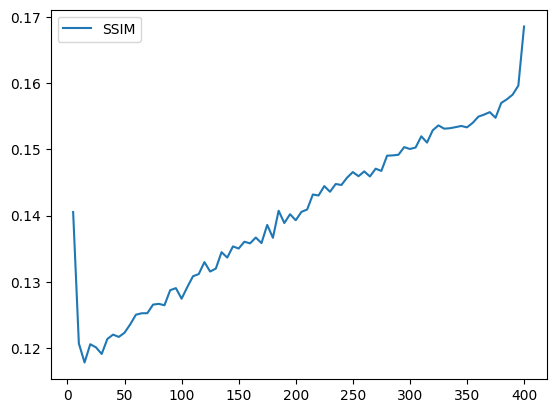

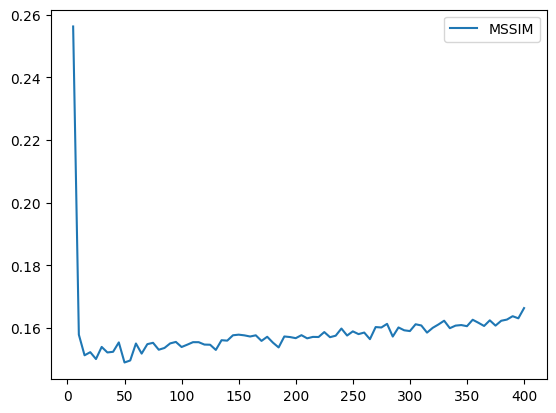

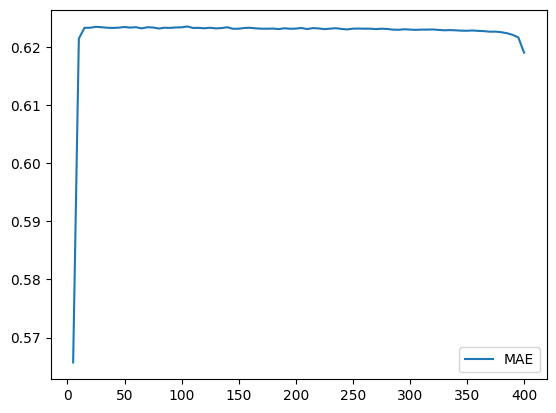

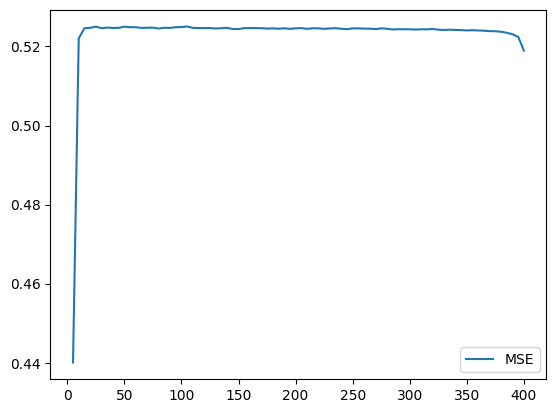

In [32]:
for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 0], np.array(metric_log)[:, 1], label=metric_name)
    plt.legend()
    plt.show()

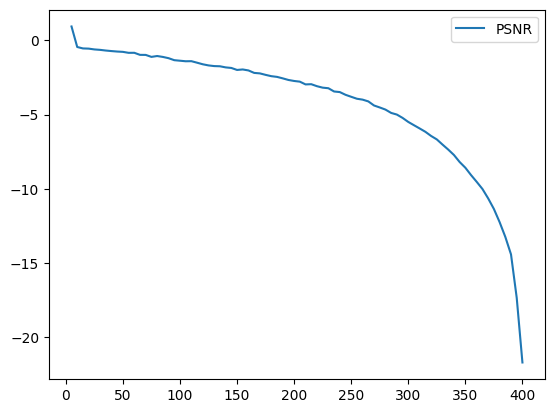

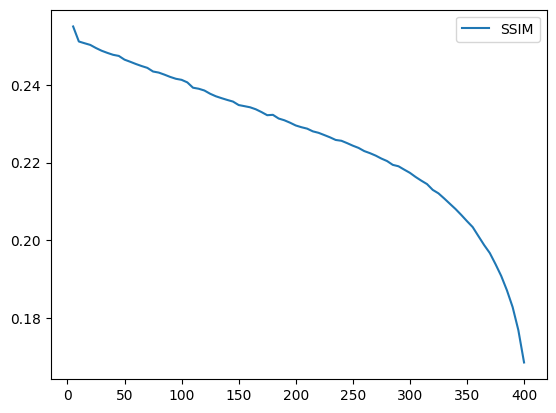

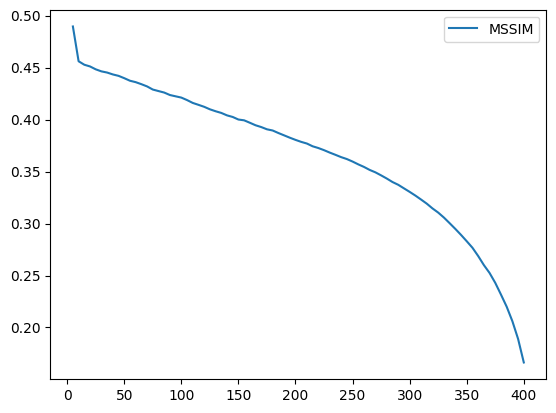

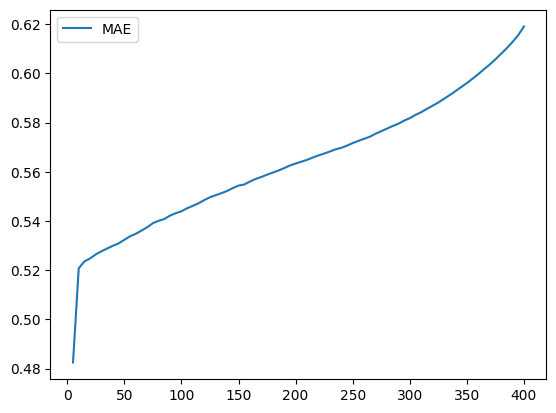

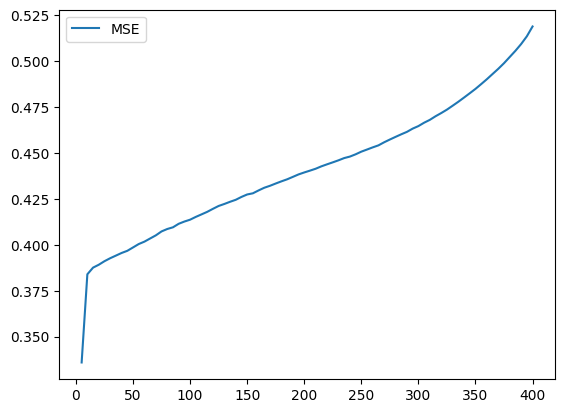

In [33]:
for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 0], np.array(metric_log)[:, 2], label=metric_name)
    plt.legend()
    plt.show()

## How does sampling from scratch look like?

### Linear sampling

In [34]:
img = torch.from_numpy(rand_img).unsqueeze(0).unsqueeze(0).float()
img = ddpm.normalize(img)

In [35]:
img = torch.from_numpy(rand_img).unsqueeze(0).unsqueeze(0).float()
img = ddpm.normalize(img)

x_cond = torch.from_numpy(seg).unsqueeze(0).unsqueeze(0).float()
x_cond = x_cond / (n_classes - 1)
#x_cond = ddpm.normalize(x_cond)
    
sampled_img = ddpm_ema.model.sample(x_cond)

NameError: name 'seg' is not defined

In [ ]:
# Plot the img, gt and sampled img side by side
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(img.squeeze().detach().numpy(), cmap='gray')
ax[1].imshow(x_cond.squeeze().detach().numpy(), cmap='viridis')
ax[2].imshow(sampled_img.squeeze().detach().numpy(), cmap='gray')
plt.show()


In [ ]:
for metric_name, metric_fun in metrics_to_log_default.items():
    print(f'{metric_name}: {metric_fun(img, sampled_img).item()}')

### DDIM sampling

In [ ]:
sampling_steps = 100
sampling_steps_old = ddpm_ema.model.sampling_timesteps 
ddpm_ema.model.sampling_timesteps = sampling_steps
img = torch.from_numpy(rand_img).unsqueeze(0).unsqueeze(0).float()
img = ddpm.normalize(img)

x_cond = torch.from_numpy(seg).unsqueeze(0).unsqueeze(0).float()
x_cond = x_cond / (n_classes - 1)
#x_cond = ddpm.normalize(x_cond)
    
sampled_img = ddpm_ema.model.ddim_sample(x_cond)
ddpm_ema.model.sampling_timesteps = sampling_steps_old

# Plot the img, gt and sampled img side by side
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(img.squeeze().detach().numpy(), cmap='gray')
ax[1].imshow(x_cond.squeeze().detach().numpy(), cmap='viridis')
ax[2].imshow(sampled_img.squeeze().detach().numpy(), cmap='gray')
plt.show()

for metric_name, metric_fun in metrics_to_log_default.items():
    print(f'{metric_name}: {metric_fun(img, sampled_img).item()}')

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(img.squeeze().detach().numpy(), cmap='gray')
ax[1].imshow(x_cond.squeeze().detach().numpy(), cmap='viridis')
ax[2].imshow(ddpm.unnormalize(sampled_img).squeeze().detach().numpy(), cmap='gray')
plt.show()

for metric_name, metric_fun in metrics_to_log_default.items():
    print(f'{metric_name}: {metric_fun(img, sampled_img).item()}')

## How does slight noising and denoising look like

In [ ]:
t = 50
plot_every = 50
measure_metrics_every = 5

metrics = evaluate_linear_denoising(
    img=rand_img.copy(),
    seg=seg.copy(),
    n_classes=n_classes,
    t=t,
    ddpm=ddpm_ema.model,
    plot_every=plot_every
) 

In [ ]:
for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 0], np.array(metric_log)[:, 1], label=metric_name)
    plt.legend()
    plt.show()

In [ ]:
for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 0], np.array(metric_log)[:, 2], label=metric_name)
    plt.legend()
    plt.show()

### Let's try with a medium ammount of noise

In [ ]:
t = 200
metrics = evaluate_linear_denoising(
    img=rand_img.copy(),
    seg=seg.copy(),
    n_classes=n_classes,
    t=t,
    ddpm=ddpm_ema.model,
) 

In [ ]:
for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 0], np.array(metric_log)[:, 1], label=metric_name)
    plt.legend()
    plt.show()

In [ ]:
for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 0], np.array(metric_log)[:, 2], label=metric_name)
    plt.legend()
    plt.show()

### Let's try with a stronger noise

In [ ]:
t = 500
plot_every = 50

metrics = evaluate_linear_denoising(
    img=rand_img.copy(),
    seg=seg.copy(),
    n_classes=n_classes,
    t=t,
    ddpm=ddpm_ema.model,
) 

for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 0], np.array(metric_log)[:, 1], label=metric_name)
    plt.legend()
    plt.show()
    
for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 0], np.array(metric_log)[:, 2], label=metric_name)
    plt.legend()
    plt.show()

In [ ]:
t = 800
plot_every = 100

metrics = evaluate_linear_denoising(
    img=rand_img.copy(),
    seg=seg.copy(),
    n_classes=n_classes,
    t=t,
    ddpm=ddpm_ema.model,
    plot_every=plot_every
) 

for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 1], np.array(metric_log)[:, 1], label=metric_name)
    plt.legend()
    plt.show()
    
for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 2], np.array(metric_log)[:, 1], label=metric_name)
    plt.legend()
    plt.show()

In [ ]:
t = 1000
plot_every = 100

metrics = evaluate_linear_denoising(
    img=rand_img.copy(),
    seg=seg.copy(),
    n_classes=n_classes,
    t=t,
    ddpm=ddpm_ema.model,
    plot_every=plot_every
) 

for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 1], np.array(metric_log)[:, 1], label=metric_name)
    plt.legend()
    plt.show()
    
for metric_name, metric_log in metrics.items():
    plt.plot(np.array(metric_log)[:, 0], np.array(metric_log)[:, 2], label=metric_name)
    plt.legend()
    plt.show()

## How does DDIM sampling behave?

### When used on smaller noising levels